# Our Goal ✨
1. Similarity Recommendation Based on Node2Vec
2. Let's Build a Recommendation System Using H&M Dataset!

Hello, Kagglers!

In this notebook, we'll try fashion recommendations using the Node2Vec algorithm, which is implemented by applying the simple concept of Graph Neural Network. Let's compare the images of clothes that the user purchased and the recommended clothes to see if the similarity score is reliable!

You can also find the .ipynb file that can be run all at once on this [GitHub link](https://github.com/H4Y3J1N/Graph-Travel/tree/H4Y3J1N).

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import networkx as nx
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.image as mpimg
import random

In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import zipfile

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import seaborn as sns

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/h-and-m-personalized-fashion-recommendations/sample_submission.csv
/kaggle/input/h-and-m-personalized-fashion-recommendations/articles.csv
/kaggle/input/h-and-m-personalized-fashion-recommendations/transactions_train.csv
/kaggle/input/h-and-m-personalized-fashion-recommendations/customers.csv
/kaggle/input/h-and-m-personalized-fashion-recommendations/images/057/0570177001.jpg
/kaggle/input/h-and-m-personalized-fashion-recommendations/images/057/0575944002.jpg
/kaggle/input/h-and-m-personalized-fashion-recommendations/images/057/0576129001.jpg
/kaggle/input/h-and-m-personalized-fashion-recommendations/images/057/0570806001.jpg
/kaggle/input/h-and-m-personalized-fashion-recommendations/images/057/0572155001.jpg
/kaggle/input/h-and-m-personalized-fashion-recommendations/images/057/0576693003.jpg
/kaggle/input/h-and-m-personalized-fashion-recommendations/images/057/0577759003.jpg
/kaggle/input/h-and-m-personalized-fashion-recommendations/images/057/0578630014.jpg
/kaggle/inpu

In [5]:
articles = pd.read_csv("../input/h-and-m-personalized-fashion-recommendations/articles.csv")
customers = pd.read_csv("../input/h-and-m-personalized-fashion-recommendations/customers.csv")
transactions = pd.read_csv("../input/h-and-m-personalized-fashion-recommendations/transactions_train.csv")

In order to depict this dataset as a Graph, we need to retain only the meaningful rows. The goal is to reduce sparsity as much as possible for better performance.

So, the first thing to do is to calculate the frequency of 'article_id' (product ID) and 'customer_id' (user ID), and consider filtering only users who have many purchase records & products with many purchase records.

In [10]:
item_freq = transactions.groupby('article_id')['customer_id'].nunique()
user_freq = transactions.groupby('customer_id')['article_id'].nunique()

items = item_freq[item_freq >= 100].index
users = user_freq[user_freq >= 100].index

filtered_df = transactions[transactions['article_id'].isin(items) & transactions['customer_id'].isin(users)]

Next, let's aggregate to reflect the weight we learned in the previous tutorial on the edges. This is a more in-depth application of what we've learned on the journey so far. The weight given to the edge can contain various information values. By assigning appropriate values, we can also reflect in the graph how much the user prefers the item.

Let's take an example. Consider user 0, item A, and item B as nodes. If user 0 purchased item A 10 times and item B once... We could say the preference for item A is higher, right?

There are two edges connecting these three nodes. The edges that stretch from the user 0 node to each item node. What relation might these edges imply? It's the purchase history! Therefore, we can assign a weight of 10 to the edge connected to item A node and a weight of 1 to the edge connected to item B.

In [11]:
freq = filtered_df.groupby(['customer_id', 'article_id']).size().reset_index(name='frequency')

GraphTravel_HM = filtered_df.merge(freq, on=['customer_id', 'article_id'], how='left')

GraphTravel_HM = GraphTravel_HM[GraphTravel_HM['frequency'] >= 10]


Now we have information that allows us to understand a specific user's preference (repeat purchase frequency) for an item. It seems we can assign weight information to the edge using the 'frequency' column!

> Is it okay to use weight and random walk search bias together?

Yes! Weights and search bias can be used simultaneously and do not conflict with each other. Each controls a different aspect of the random walk, and using them together allows for more detailed control over how the random walk navigates the graph. To explain each concept a little more,

1. Weight is used to indicate the importance of an edge and is used to determine the probability that the random walk algorithm will follow a particular edge. Edges with high weights have a higher probability of being chosen by the random walk than edges with low weights.

2. Search bias is controlled by the two parameters p and q in Node2Vec. These parameters control the degree to which the random walk prefers to revisit nodes it has visited before or visit new nodes it has not yet visited.

And lastly, in order to reflect only meaningful information in the Graph, the dataset was filtered to leave only rows of products purchased more than 10 times by a user. 

Now that some preprocessing seems to have been done, shall we take a moment to check the state of the dataset?

In [12]:
display(GraphTravel_HM)

print("unique customer_id" , GraphTravel_HM.customer_id.nunique())
print("unique article_id" , GraphTravel_HM.article_id.nunique())

,t_dat,customer_id,article_id,price,sales_channel_id,frequency
194,2018-09-20,06636eaa476a2f3417e8d11905e17a8066b4c9ae26bc78...,399201022,0.059305,2,12
195,2018-09-20,06636eaa476a2f3417e8d11905e17a8066b4c9ae26bc78...,399201022,0.059305,2,12
196,2018-09-20,06636eaa476a2f3417e8d11905e17a8066b4c9ae26bc78...,399201022,0.059305,2,12
1181,2018-09-20,1f58e8b3be25c4ca4bb457902f911cfbd4ed3a3f502685...,228257001,0.006763,2,19
1182,2018-09-20,1f58e8b3be25c4ca4bb457902f911cfbd4ed3a3f502685...,228257001,0.006797,2,19
...,...,...,...,...,...,...
6998469,2020-09-22,03fdb0bf2d9ff8ba23e1b4aef53709119aad5bc83691d8...,554450043,0.033881,2,18
6998949,2020-09-22,189a65461f77ed2d1621bb1201e68c4af1cfacf110d08e...,160442010,0.012898,2,11
6998950,2020-09-22,189a65461f77ed2d1621bb1201e68c4af1cfacf110d08e...,160442010,0.012915,2,11
6998951,2020-09-22,189a65461f77ed2d1621bb1201e68c4af1cfacf110d08e...,160442010,0.012898,2,11


unique customer_id 1013
unique article_id 922


Wow, the original transactions dataframe had as many as 31,788,324 rows. It has significantly reduced. It's quite surprising that there are still around 25,000 left, even though we filtered with quite a high value.

There are 922 unique users and 1,013 unique items remaining. It seems reasonable to expect quite useful recommendation results from this amount.

On one hand, I'm curious about the distribution of frequency values. Shall we draw it directly and check?

/tmp/ipykernel_32/521335795.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(GraphTravel_HM['frequency'], kde=True, bins=30)


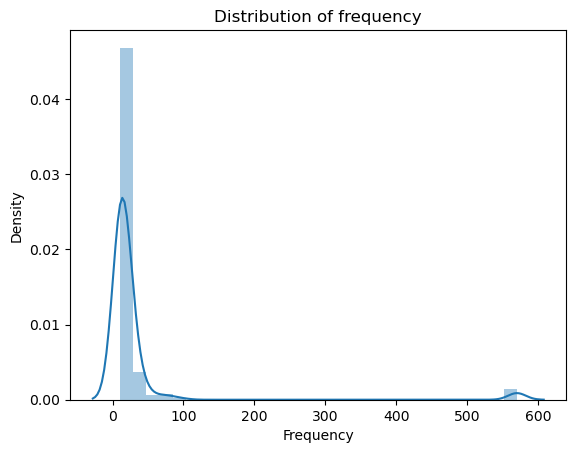

In [13]:
sns.distplot(GraphTravel_HM['frequency'], kde=True, bins=30)

plt.title('Distribution of frequency')
plt.xlabel('Frequency')
plt.ylabel('Density')

plt.show()

Considering we left only the products with more than 10 in the dataframe, the distribution is quite understandable. Most of the repurchase frequencies are concentrated between 10 and 100.

It looks like there's a product that's been purchased as many as 550 times... I wonder what this could be? Although EDA is not important to us right now and Erica will ignore her curiosity, those who are curious might find it fun to check for themselves.

Now, let's move to the final step of preprocessing. The values of customer_id were mixed with integers and strings as hash values, weren't they? I'll map these to integers. If it's an integer starting from 0, it's likely not to overlap with the article_id.

Also, to print the item name along with the recommendation result, I'll create one dictionary as well.

In [14]:
unique_customer_ids = GraphTravel_HM['customer_id'].unique()
customer_id_mapping = {id: i for i, id in enumerate(unique_customer_ids)}
GraphTravel_HM['customer_id'] = GraphTravel_HM['customer_id'].map(customer_id_mapping)

item_name_mapping = dict(zip(articles['article_id'], articles['prod_name'])) # prod_name

In [17]:
# customer_id_mapping

Now that the preprocessing for building a recommendation system is complete, let's officially create a Graph.

After creating the graph, I will implement and apply the Biased Random Walk and Generate Walk code.
While we're at it, let's proceed straight through the process of extracting embeddings with the Word2Vec model!

In [15]:
G = nx.Graph()

for index, row in GraphTravel_HM.iterrows():
    G.add_node(row['customer_id'], type='user')
    G.add_node(row['article_id'], type='item')
    G.add_edge(row['customer_id'], row['article_id'], weight=row['frequency'])

In [16]:
# biased random walk  
def biased_random_walk(G, start_node, walk_length, p=1, q=1):
    walk = [start_node]

    while len(walk) < walk_length:
        cur_node = walk[-1]
        cur_neighbors = list(G.neighbors(cur_node))

        if len(cur_neighbors) > 0:
            if len(walk) == 1:
                walk.append(random.choice(cur_neighbors))
            else:
                prev_node = walk[-2]

                probability = []
                for neighbor in cur_neighbors:
                    if neighbor == prev_node:
                        # Return parameter 
                        probability.append(1/p)
                    elif G.has_edge(neighbor, prev_node):
                        # Stay parameter 
                        probability.append(1)
                    else:
                        # In-out parameter 
                        probability.append(1/q)

                probability = np.array(probability)
                probability = probability / probability.sum()  # normalize

                next_node = np.random.choice(cur_neighbors, p=probability)
                walk.append(next_node)
        else:
            break

    return walk

In [17]:
def generate_walks(G, num_walks, walk_length, p=1, q=1):
    walks = []
    nodes = list(G.nodes())
    for _ in range(num_walks):
        random.shuffle(nodes)  # to ensure randomness
        for node in nodes:
            walk_from_node = biased_random_walk(G, node, walk_length, p, q)
            walks.append(walk_from_node)
    return walks

In [21]:
# generate_walks(G, 2, 8, p=0.5, q=0.5)

In [18]:
# Random Walk 
walks = generate_walks(G, num_walks=10, walk_length=20, p=9, q=1)
filtered_walks = [walk for walk in walks if len(walk) >= 5]

# to String  (for Word2Vec input)
walks = [[str(node) for node in walk] for walk in walks]

# Word2Vec train
model = Word2Vec(walks, vector_size=128, window=5, min_count=0,  hs=1, sg=1, workers=4, epochs=10)

# node embedding extract
embeddings = {node_id: model.wv[node_id] for node_id in model.wv.index_to_key}

In [1]:
embeddings

NameError: name 'embeddings' is not defined

In the middle of the code, it might be good to run the generate_walks() method separately or to print out the embeddings to visually check their shape at least once.

The line of code creating the Random Walk is a point of interest. In this tutorial code, p is set very high as generate_walks(G, num_walks=10, walk_length=20, p=9, q=1). I hope you try changing this number yourself and check how the recommendation result changes!


## get_user_embedding 

This function returns the Embedding of the given user Node. Here, embedding refers to a vector that quantifies the user's preferences or behavior patterns. This vector is used in the item recommendation algorithm we are implementing to calculate the similarity between the user and the item.

In [19]:
def get_user_embedding(user_id, embeddings):
    return embeddings[str(user_id)]

## get_rated_items

This function returns a list of items already rated (or purchased) by the given user. This information will be used to exclude items already rated by the user from the recommendation list.
Of course, there's no rule that items with a history of purchase should not be recommended, and it could help encourage repurchase... but if the recommendation list becomes an order review list, there's no point in creating embeddings, right?

I will set the purpose of this recommendation system to recommend unseen items. That means I'm going to recommend items that the user hasn't bought yet but might like!

In [20]:
def get_rated_items(user_id, df):
    return set(df[df['customer_id'] == user_id]['article_id'])

## calculate_similarities

This function calculates the similarity between the given user and all items, and returns this similarity as a list along with the item ID. In other words, it will calculate the cosine similarity between the user embedding and the embedding of each item. Items that the user has already rated are excluded from the similarity calculation.

In [21]:
def calculate_similarities(user_id, df, embeddings):
    rated_items = get_rated_items(user_id, df)
    user_embedding = get_user_embedding(user_id, embeddings)

    item_similarities = []
    for item_id in set(df['article_id']):
        if item_id not in rated_items:  
            item_embedding = embeddings[str(item_id)]
            similarity = cosine_similarity([user_embedding], [item_embedding])[0][0]
            item_similarities.append((item_id, similarity))

    return item_similarities

## show_images

This is a function that takes a list of items as input, prints out images for each item, and also prints out the similarity score. The item list given as input includes both the item ID and similarity.

Since our currently implemented similarity-based recommendation system doesn't have a separately defined label to judge the accuracy of recommendations, we implemented the tutorial code to be able to see the images together in order to intuitively check the results of the recommendation system!

In [22]:
def show_images(items, item_name_mapping, num_items, show_similarity=False):
    f, ax = plt.subplots(1, num_items, figsize=(20,10))
    if num_items == 1:
        ax = [ax]
    for i, item in enumerate(items):
        item_id, similarity = item
        print(f"- Item {item_id}: {item_name_mapping[item_id]}", end='')
        if show_similarity:
            print(f" with similarity score: {similarity}")
        else:
            print()
        img_path = f"../input/h-and-m-personalized-fashion-recommendations/images/0{str(item_id)[:2]}/0{int(item_id)}.jpg"
        try:
            img = mpimg.imread(img_path)
            ax[i].imshow(img)
            ax[i].set_title(f'Item {item_id}')
            ax[i].set_xticks([], [])
            ax[i].set_yticks([], [])
            ax[i].grid(False)
        except FileNotFoundError:
            print(f"Image for item {item_id} not found.")
    plt.show()

## recommend_items

This function places the functions defined above appropriately, and outputs the final recommendation result. Ultimately, it finds items that are close in Embedding distance based on the user's transaction history, in other words, items the user might like, or in other words, the most similar items, and visually outputs the result.

It means that you can present a recommendation result that can be called personalized recommendation!

In [23]:

def recommend_items(user_id, df, embeddings, item_name_mapping, num_items=5):
    rated_items = get_rated_items(user_id, df)
    
    print(f"User {user_id} has purchased:")
    show_images([(item_id, 0) for item_id in list(rated_items)[:5]], item_name_mapping, min(len(rated_items), 5))
    
    item_similarities = calculate_similarities(user_id, df, embeddings)

    recommended_items = sorted(item_similarities, key=lambda x: x[1], reverse=True)[:num_items]

    print(f"\nRecommended items for user {user_id}:")
    show_images(recommended_items, item_name_mapping, num_items, show_similarity=True)


I made this code to output the top 5 recommended results.
To be able to judge visually whether it was a good recommendation, I arranged not only the similarity score but also the image.

1. It prints out five items that the user has purchased in the past, and
2. It presents five items with high similarity that are considered to be likable to the user.

In this way, you can judge whether it is a completely arbitrary recommendation or not, even without an accuracy score or labels, through similarity scores and images. Well, shall we finally activate the long-awaited first recommendation system?

User 45 has purchased:
- Item 598811011: Dingo tank
- Item 189616006: Heavy jsy long leg
- Item 598517002: SANDY shorts
- Item 633808016: Terrier tee TOP PRODUCT
- Item 443696021: BO basic OH BB


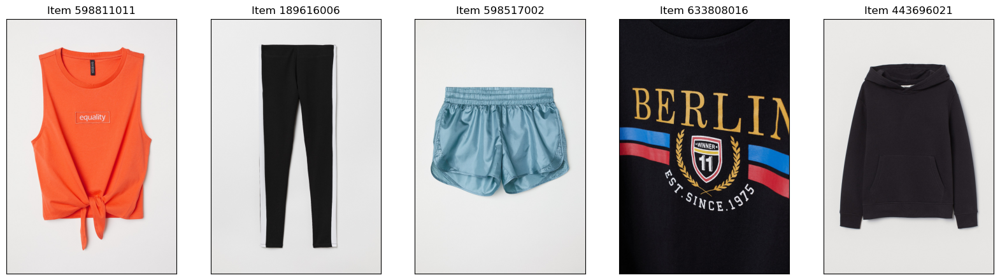


Recommended items for user 45:
- Item 568597022: Hayes slim with similarity score: 0.8440454006195068
- Item 816563002: Drizzle with similarity score: 0.7303155064582825
- Item 565036003: Noah hood with similarity score: 0.7105495929718018
- Item 708285001: Fleet price hood with similarity score: 0.6921720504760742
- Item 403448008: GREG tanktop BB 2-p with similarity score: 0.6852233409881592


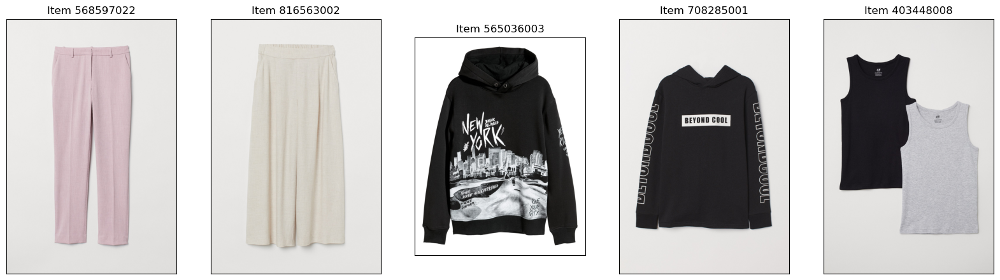

In [24]:
# costomer 45's top 5 
recommend_items(45, GraphTravel_HM, embeddings, item_name_mapping, num_items=5)

In [1]:
# costomer 45's top 5 
recommend_items(56, GraphTravel_HM, embeddings, item_name_mapping, num_items=5)

NameError: name 'recommend_items' is not defined

Oh, quite interesting results came out, didn't they? Of course, it's more of a dream interpretation... The clothes that User 45 has purchased have the following design commonalities:

1. Casual and comfortable clothes
2. Clothes with shirring (wrinkles)
3. Preference for both vivid primary colors and achromatic colors

And the recommended items also seem to have similar commonalities! Plus, a hoodie is also recommended. It seems like we've made quite a decent recommendation with a simple code.

It would also be fun to manually print out the recommended results for other users by changing the numbers.

# If this tutorial was helpful, please Upvote! 🥰

혹시 한국인인가요? 이 튜토리얼 코드의 한국어 버전이 필요하다면, Graph User Group 사이트에 찾아오세요!

GUG에서는 매주 GNN 기술을 논문과 연계해 공유하는 뉴스레터와, 튜토리얼이 연재되고 있답니다.

✈🎫 Want to know about GUG? [Link](https://www.graphusergroup.com/)